### Hypothesis 5: Stress tests show PD sensitivity to leverage, asset volatility, and interest rates.

Basic Idea:
- choose firms
- find baseline pd
- choose stress scenarios
    - 10% change in debt
    - 20% change in volatility
    - 1% change in interest rate
    - different combinations of stress scenarios
- calculate pd in stress scenarios
- calculate pd delta for each stress scenario
- use metrics like mean delta pd, % delta pd, or correlation to see sensitivity levels

In [63]:
import pandas as pd
import numpy as np
from scipy.stats import norm
from scipy.optimize import root

In [64]:
import os
print(os.getcwd())

/Users/brockwilliams/Desktop/MF728_Project/hypothesis-5


In [66]:
import os
print(os.listdir('../data'))

['.raw_data.csv.icloud', 'data_processing.ipynb', 'api_access.ipynb', 'TreasuryRaw.csv', 'README.md', 'clean_data.csv', '.clean_data 2.csv.icloud', '.raw_data 2.csv.icloud', '.ipynb_checkpoints']


In [67]:
def compute_merton_pd(E, sigma_E, D, r, T=1.0, verbose=False):    

    def equations(vars):
        V, sigma_V = vars
        if V <= 0 or sigma_V <= 0:
            return 1e10, 1e10  # large penalty for invalid values
        d1 = (np.log(V / D) + (r + 0.5 * sigma_V**2) * T) / (sigma_V * np.sqrt(T))
        d2 = d1 - sigma_V * np.sqrt(T)
        eq1 = V * norm.cdf(d1) - D * np.exp(-r * T) * norm.cdf(d2) - E
        eq2 = (V / E) * norm.cdf(d1) * sigma_V - sigma_E
        return [eq1, eq2]

    V0 = E + D
    sigma_V0 = sigma_E
    result = root(equations, [V0, sigma_V0], method='hybr')

    if result.success:
        V_opt, sigma_V_opt = result.x
        d2 = (np.log(V_opt / D) + (r - 0.5 * sigma_V_opt ** 2) * T) / (sigma_V_opt * np.sqrt(T))
        pd = norm.cdf(-d2)
        return pd
    else:
        if verbose:
            print("Failure for firm:", E, sigma_E, D, r)
            print("Message:", result.message)
        return np.nan

In [70]:
df= pd.read_csv('../data/clean_data.csv')
df['merton_pd'] = df.apply(
    lambda row: compute_merton_pd(
        E=row['market_cap'],
        sigma_E=row['equity_volatility'],
        D=row['total_debt'],
        r=row['rf'] / 100,  # Convert percentage to decimal
        verbose=True
    ),
    axis=1
)
print(df)

/var/folders/59/hb0z0gw54v346g6175w3ns9r0000gp/T/ipykernel_23568/2908855909.py:7: RuntimeWarning: divide by zero encountered in scalar divide
  d1 = (np.log(V / D) + (r + 0.5 * sigma_V**2) * T) / (sigma_V * np.sqrt(T))
/var/folders/59/hb0z0gw54v346g6175w3ns9r0000gp/T/ipykernel_23568/2908855909.py:19: RuntimeWarning: divide by zero encountered in scalar divide
  d2 = (np.log(V_opt / D) + (r - 0.5 * sigma_V_opt ** 2) * T) / (sigma_V_opt * np.sqrt(T))


Failure for firm: 12798849840.0 1.184655266718994 215718000000.0 0.0347
Message: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
Failure for firm: 5512109699.999999 1.3433913552168046 215718000000.0 0.0341
Message: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
Failure for firm: 7232963460.0 1.3732017429642132 215718000000.0 0.0354
Message: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
Failure for firm: 10352010900.0 1.4225119557038717 215718000000.0 0.0378
Message: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
Failure for firm: 12691296479.999998 1.438630992515603 215718000000.0 0.0383
Message: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
Failure for firm: 13444170000.0 1.440241532748829

In [71]:
df['pd_valid'] = df['merton_pd'].notna()
df.to_csv("merton_model_output.csv", index=False)

In [72]:
df['pd_valid'].value_counts()

pd_valid
True     438790
False      2260
Name: count, dtype: int64

In [73]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

print(df[df['merton_pd'].isna() == True])
(df[df['merton_pd'].isna() == True]).to_csv("nans.csv", index=False)

pd.reset_option('display.max_rows')
pd.reset_option('display.max_columns')
pd.reset_option('display.max_colwidth')

              date  permno  tic                          conm         PRC  \
23773   2008-09-15   66800  AIG  AMERICAN INTERNATIONAL GROUP   79.665272   
23775   2008-09-17   66800  AIG  AMERICAN INTERNATIONAL GROUP   34.309623   
23776   2008-09-18   66800  AIG  AMERICAN INTERNATIONAL GROUP   45.020921   
23777   2008-09-19   66800  AIG  AMERICAN INTERNATIONAL GROUP   64.435146   
23778   2008-09-22   66800  AIG  AMERICAN INTERNATIONAL GROUP   78.995816   
23779   2008-09-23   66800  AIG  AMERICAN INTERNATIONAL GROUP   83.682008   
23780   2008-09-24   66800  AIG  AMERICAN INTERNATIONAL GROUP   55.397490   
23781   2008-09-25   66800  AIG  AMERICAN INTERNATIONAL GROUP   50.543933   
23782   2008-09-26   66800  AIG  AMERICAN INTERNATIONAL GROUP   52.719665   
23783   2008-09-29   66800  AIG  AMERICAN INTERNATIONAL GROUP   41.841004   
23784   2008-09-30   66800  AIG  AMERICAN INTERNATIONAL GROUP   55.732218   
23785   2008-10-01   66800  AIG  AMERICAN INTERNATIONAL GROUP   66.108787   

In [74]:
display(df)

,date,permno,tic,conm,PRC,atq,dlcq,dlttq,SHROUT,market_cap,total_debt,leverage,log_return,equity_volatility,rf,merton_pd,pd_valid
0,2006-01-03,14593,AAPL,APPLE INC,2.669643,1.418100e+10,0.000000e+00,0.000000e+00,845617.0,6.320987e+10,0.000000e+00,0.000000,0.039012,0.388765,4.37,0.000000e+00,True
1,2006-01-04,14593,AAPL,APPLE INC,2.677500,1.418100e+10,0.000000e+00,0.000000e+00,845617.0,6.339591e+10,0.000000e+00,0.000000,0.002939,0.388705,4.36,0.000000e+00,True
2,2006-01-05,14593,AAPL,APPLE INC,2.656429,1.418100e+10,0.000000e+00,0.000000e+00,845617.0,6.289699e+10,0.000000e+00,0.000000,-0.007901,0.388831,4.36,0.000000e+00,True
3,2006-01-06,14593,AAPL,APPLE INC,2.725000,1.418100e+10,0.000000e+00,0.000000e+00,845617.0,6.452058e+10,0.000000e+00,0.000000,0.025486,0.389453,4.38,0.000000e+00,True
4,2006-01-09,14593,AAPL,APPLE INC,2.716071,1.418100e+10,0.000000e+00,0.000000e+00,845617.0,6.430917e+10,0.000000e+00,0.000000,-0.003282,0.383677,4.38,0.000000e+00,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
441045,2024-12-24,11850,XOM,EXXON MOBIL CORP,106.400000,4.619160e+11,5.632000e+09,3.691800e+10,4395095.0,4.676381e+11,4.255000e+10,0.092116,0.000940,0.192976,4.59,1.077615e-45,True
441046,2024-12-26,11850,XOM,EXXON MOBIL CORP,106.490000,4.619160e+11,5.632000e+09,3.691800e+10,4395095.0,4.680337e+11,4.255000e+10,0.092116,0.000846,0.192966,4.58,1.021519e-45,True
441047,2024-12-27,11850,XOM,EXXON MOBIL CORP,106.480000,4.619160e+11,5.632000e+09,3.691800e+10,4395095.0,4.679897e+11,4.255000e+10,0.092116,-0.000094,0.192904,4.62,9.402393e-46,True
441048,2024-12-30,11850,XOM,EXXON MOBIL CORP,105.760000,4.619160e+11,5.632000e+09,3.691800e+10,4395095.0,4.648252e+11,4.255000e+10,0.092116,-0.006785,0.192463,4.55,9.069544e-46,True


In [108]:
print(df['merton_pd'].describe())

count    4.387900e+05
mean     2.545288e-02
std      1.387757e-01
min      0.000000e+00
25%      2.656212e-36
50%      7.620877e-20
75%      6.856285e-10
max      1.000000e+00
Name: merton_pd, dtype: float64


#### 10% Change in Debt

In [76]:
df1= pd.read_csv('../data/clean_data.csv')
df1['merton_pd'] = df1.apply(
    lambda row: compute_merton_pd(
        E=row['market_cap'],
        sigma_E=row['equity_volatility'],
        D=row['total_debt']*0.9,
        r=row['rf'] / 100,  # Convert percentage to decimal
        verbose=True
    ),
    axis=1
)
print(df1)

/var/folders/59/hb0z0gw54v346g6175w3ns9r0000gp/T/ipykernel_23568/2908855909.py:7: RuntimeWarning: divide by zero encountered in scalar divide
  d1 = (np.log(V / D) + (r + 0.5 * sigma_V**2) * T) / (sigma_V * np.sqrt(T))
/var/folders/59/hb0z0gw54v346g6175w3ns9r0000gp/T/ipykernel_23568/2908855909.py:19: RuntimeWarning: divide by zero encountered in scalar divide
  d2 = (np.log(V_opt / D) + (r - 0.5 * sigma_V_opt ** 2) * T) / (sigma_V_opt * np.sqrt(T))


Failure for firm: 12798849840.0 1.184655266718994 194146200000.0 0.0347
Message: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
Failure for firm: 10083127500.0 1.2063649383315511 194146200000.0 0.0348
Message: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
Failure for firm: 5512109699.999999 1.3433913552168046 194146200000.0 0.0341
Message: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
Failure for firm: 7232963460.0 1.3732017429642132 194146200000.0 0.0354
Message: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
Failure for firm: 10352010900.0 1.4225119557038717 194146200000.0 0.0378
Message: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
Failure for firm: 12691296479.999998 1.43863099251560

In [77]:
df1['pd_valid'] = df1['merton_pd'].notna()
df1.to_csv("merton_model_output1.csv", index=False)

In [78]:
df1['pd_valid'].value_counts()

pd_valid
True     438924
False      2126
Name: count, dtype: int64

In [79]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

print(df1[df1['merton_pd'].isna() == True])
(df[df['merton_pd'].isna() == True]).to_csv("nans.csv", index=False)

pd.reset_option('display.max_rows')
pd.reset_option('display.max_columns')
pd.reset_option('display.max_colwidth')

              date  permno  tic                          conm         PRC  \
23773   2008-09-15   66800  AIG  AMERICAN INTERNATIONAL GROUP   79.665272   
23774   2008-09-16   66800  AIG  AMERICAN INTERNATIONAL GROUP   62.761506   
23775   2008-09-17   66800  AIG  AMERICAN INTERNATIONAL GROUP   34.309623   
23776   2008-09-18   66800  AIG  AMERICAN INTERNATIONAL GROUP   45.020921   
23777   2008-09-19   66800  AIG  AMERICAN INTERNATIONAL GROUP   64.435146   
23778   2008-09-22   66800  AIG  AMERICAN INTERNATIONAL GROUP   78.995816   
23779   2008-09-23   66800  AIG  AMERICAN INTERNATIONAL GROUP   83.682008   
23780   2008-09-24   66800  AIG  AMERICAN INTERNATIONAL GROUP   55.397490   
23781   2008-09-25   66800  AIG  AMERICAN INTERNATIONAL GROUP   50.543933   
23782   2008-09-26   66800  AIG  AMERICAN INTERNATIONAL GROUP   52.719665   
23783   2008-09-29   66800  AIG  AMERICAN INTERNATIONAL GROUP   41.841004   
23784   2008-09-30   66800  AIG  AMERICAN INTERNATIONAL GROUP   55.732218   

In [80]:
display(df1)

,date,permno,tic,conm,PRC,atq,dlcq,dlttq,SHROUT,market_cap,total_debt,leverage,log_return,equity_volatility,rf,merton_pd,pd_valid
0,2006-01-03,14593,AAPL,APPLE INC,2.669643,1.418100e+10,0.000000e+00,0.000000e+00,845617.0,6.320987e+10,0.000000e+00,0.000000,0.039012,0.388765,4.37,0.000000e+00,True
1,2006-01-04,14593,AAPL,APPLE INC,2.677500,1.418100e+10,0.000000e+00,0.000000e+00,845617.0,6.339591e+10,0.000000e+00,0.000000,0.002939,0.388705,4.36,0.000000e+00,True
2,2006-01-05,14593,AAPL,APPLE INC,2.656429,1.418100e+10,0.000000e+00,0.000000e+00,845617.0,6.289699e+10,0.000000e+00,0.000000,-0.007901,0.388831,4.36,0.000000e+00,True
3,2006-01-06,14593,AAPL,APPLE INC,2.725000,1.418100e+10,0.000000e+00,0.000000e+00,845617.0,6.452058e+10,0.000000e+00,0.000000,0.025486,0.389453,4.38,0.000000e+00,True
4,2006-01-09,14593,AAPL,APPLE INC,2.716071,1.418100e+10,0.000000e+00,0.000000e+00,845617.0,6.430917e+10,0.000000e+00,0.000000,-0.003282,0.383677,4.38,0.000000e+00,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
441045,2024-12-24,11850,XOM,EXXON MOBIL CORP,106.400000,4.619160e+11,5.632000e+09,3.691800e+10,4395095.0,4.676381e+11,4.255000e+10,0.092116,0.000940,0.192976,4.59,2.202954e-48,True
441046,2024-12-26,11850,XOM,EXXON MOBIL CORP,106.490000,4.619160e+11,5.632000e+09,3.691800e+10,4395095.0,4.680337e+11,4.255000e+10,0.092116,0.000846,0.192966,4.58,2.082531e-48,True
441047,2024-12-27,11850,XOM,EXXON MOBIL CORP,106.480000,4.619160e+11,5.632000e+09,3.691800e+10,4395095.0,4.679897e+11,4.255000e+10,0.092116,-0.000094,0.192904,4.62,1.907547e-48,True
441048,2024-12-30,11850,XOM,EXXON MOBIL CORP,105.760000,4.619160e+11,5.632000e+09,3.691800e+10,4395095.0,4.648252e+11,4.255000e+10,0.092116,-0.006785,0.192463,4.55,1.826638e-48,True


In [109]:
print(df1['merton_pd'].describe())

count    4.389240e+05
mean     2.440448e-02
std      1.371439e-01
min      0.000000e+00
25%      2.104567e-38
50%      6.429907e-21
75%      2.390171e-10
max      1.000000e+00
Name: merton_pd, dtype: float64


#### 10% Change in Volatility

In [82]:
df2= pd.read_csv('../data/clean_data.csv')
df2['merton_pd'] = df2.apply(
    lambda row: compute_merton_pd(
        E=row['market_cap'],
        sigma_E=row['equity_volatility'] * 0.9,
        D=row['total_debt'],
        r=row['rf'] / 100,  # Convert percentage to decimal
        verbose=True
    ),
    axis=1
)
print(df2)

/var/folders/59/hb0z0gw54v346g6175w3ns9r0000gp/T/ipykernel_23568/2908855909.py:7: RuntimeWarning: divide by zero encountered in scalar divide
  d1 = (np.log(V / D) + (r + 0.5 * sigma_V**2) * T) / (sigma_V * np.sqrt(T))
/var/folders/59/hb0z0gw54v346g6175w3ns9r0000gp/T/ipykernel_23568/2908855909.py:19: RuntimeWarning: divide by zero encountered in scalar divide
  d2 = (np.log(V_opt / D) + (r - 0.5 * sigma_V_opt ** 2) * T) / (sigma_V_opt * np.sqrt(T))


Failure for firm: 12798849840.0 1.0661897400470945 215718000000.0 0.0347
Message: The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.
Failure for firm: 5512109699.999999 1.209052219695124 215718000000.0 0.0341
Message: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
Failure for firm: 7232963460.0 1.235881568667792 215718000000.0 0.0354
Message: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
Failure for firm: 13444170000.0 1.2962173794739464 215718000000.0 0.0385
Message: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
Failure for firm: 8900040540.000002 1.3457295611970197 215718000000.0 0.038
Message: The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.
Failure for firm: 8120278680.

In [83]:
df2['pd_valid'] = df2['merton_pd'].notna()
df2.to_csv("merton_model_output2.csv", index=False)

In [84]:
df2['pd_valid'].value_counts()

pd_valid
True     439070
False      1980
Name: count, dtype: int64

In [85]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

print(df2[df2['merton_pd'].isna() == True])
(df2[df2['merton_pd'].isna() == True]).to_csv("nans.csv", index=False)

pd.reset_option('display.max_rows')
pd.reset_option('display.max_columns')
pd.reset_option('display.max_colwidth')

              date  permno  tic                          conm         PRC  \
23773   2008-09-15   66800  AIG  AMERICAN INTERNATIONAL GROUP   79.665272   
23775   2008-09-17   66800  AIG  AMERICAN INTERNATIONAL GROUP   34.309623   
23776   2008-09-18   66800  AIG  AMERICAN INTERNATIONAL GROUP   45.020921   
23779   2008-09-23   66800  AIG  AMERICAN INTERNATIONAL GROUP   83.682008   
23780   2008-09-24   66800  AIG  AMERICAN INTERNATIONAL GROUP   55.397490   
23781   2008-09-25   66800  AIG  AMERICAN INTERNATIONAL GROUP   50.543933   
23782   2008-09-26   66800  AIG  AMERICAN INTERNATIONAL GROUP   52.719665   
23783   2008-09-29   66800  AIG  AMERICAN INTERNATIONAL GROUP   41.841004   
23784   2008-09-30   66800  AIG  AMERICAN INTERNATIONAL GROUP   55.732218   
23785   2008-10-01   66800  AIG  AMERICAN INTERNATIONAL GROUP   66.108787   
23786   2008-10-02   66800  AIG  AMERICAN INTERNATIONAL GROUP   66.945607   
23787   2008-10-03   66800  AIG  AMERICAN INTERNATIONAL GROUP   64.602510   

In [86]:
display(df2)

,date,permno,tic,conm,PRC,atq,dlcq,dlttq,SHROUT,market_cap,total_debt,leverage,log_return,equity_volatility,rf,merton_pd,pd_valid
0,2006-01-03,14593,AAPL,APPLE INC,2.669643,1.418100e+10,0.000000e+00,0.000000e+00,845617.0,6.320987e+10,0.000000e+00,0.000000,0.039012,0.388765,4.37,0.000000e+00,True
1,2006-01-04,14593,AAPL,APPLE INC,2.677500,1.418100e+10,0.000000e+00,0.000000e+00,845617.0,6.339591e+10,0.000000e+00,0.000000,0.002939,0.388705,4.36,0.000000e+00,True
2,2006-01-05,14593,AAPL,APPLE INC,2.656429,1.418100e+10,0.000000e+00,0.000000e+00,845617.0,6.289699e+10,0.000000e+00,0.000000,-0.007901,0.388831,4.36,0.000000e+00,True
3,2006-01-06,14593,AAPL,APPLE INC,2.725000,1.418100e+10,0.000000e+00,0.000000e+00,845617.0,6.452058e+10,0.000000e+00,0.000000,0.025486,0.389453,4.38,0.000000e+00,True
4,2006-01-09,14593,AAPL,APPLE INC,2.716071,1.418100e+10,0.000000e+00,0.000000e+00,845617.0,6.430917e+10,0.000000e+00,0.000000,-0.003282,0.383677,4.38,0.000000e+00,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
441045,2024-12-24,11850,XOM,EXXON MOBIL CORP,106.400000,4.619160e+11,5.632000e+09,3.691800e+10,4395095.0,4.676381e+11,4.255000e+10,0.092116,0.000940,0.192976,4.59,4.728031e-56,True
441046,2024-12-26,11850,XOM,EXXON MOBIL CORP,106.490000,4.619160e+11,5.632000e+09,3.691800e+10,4395095.0,4.680337e+11,4.255000e+10,0.092116,0.000846,0.192966,4.58,4.425974e-56,True
441047,2024-12-27,11850,XOM,EXXON MOBIL CORP,106.480000,4.619160e+11,5.632000e+09,3.691800e+10,4395095.0,4.679897e+11,4.255000e+10,0.092116,-0.000094,0.192904,4.62,3.995596e-56,True
441048,2024-12-30,11850,XOM,EXXON MOBIL CORP,105.760000,4.619160e+11,5.632000e+09,3.691800e+10,4395095.0,4.648252e+11,4.255000e+10,0.092116,-0.006785,0.192463,4.55,3.824925e-56,True


In [110]:
print(df2['merton_pd'].describe())

count    4.390700e+05
mean     2.516399e-02
std      1.386335e-01
min      0.000000e+00
25%      1.969575e-44
50%      3.986492e-24
75%      7.363238e-12
max      1.000000e+00
Name: merton_pd, dtype: float64


#### 1% Change in Interest Rate

In [87]:
df3= pd.read_csv('../data/clean_data.csv')
df3['merton_pd'] = df3.apply(
    lambda row: compute_merton_pd(
        E=row['market_cap'],
        sigma_E=row['equity_volatility'],
        D=row['total_debt'],
        r=(row['rf'] -1) / 100,  # Convert percentage to decimal
        verbose=True
    ),
    axis=1
)
print(df3)

/var/folders/59/hb0z0gw54v346g6175w3ns9r0000gp/T/ipykernel_23568/2908855909.py:7: RuntimeWarning: divide by zero encountered in scalar divide
  d1 = (np.log(V / D) + (r + 0.5 * sigma_V**2) * T) / (sigma_V * np.sqrt(T))
/var/folders/59/hb0z0gw54v346g6175w3ns9r0000gp/T/ipykernel_23568/2908855909.py:19: RuntimeWarning: divide by zero encountered in scalar divide
  d2 = (np.log(V_opt / D) + (r - 0.5 * sigma_V_opt ** 2) * T) / (sigma_V_opt * np.sqrt(T))


Failure for firm: 12798849840.0 1.184655266718994 215718000000.0 0.024700000000000003
Message: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
Failure for firm: 10083127500.0 1.2063649383315511 215718000000.0 0.0248
Message: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
Failure for firm: 5512109699.999999 1.3433913552168046 215718000000.0 0.0241
Message: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
Failure for firm: 7232963460.0 1.3732017429642132 215718000000.0 0.0254
Message: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
Failure for firm: 10352010900.0 1.4225119557038717 215718000000.0 0.0278
Message: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
Failure for firm: 12691296479.999998 1.

In [88]:
df3['pd_valid'] = df3['merton_pd'].notna()
df3.to_csv("merton_model_output3.csv", index=False)

In [89]:
df3['pd_valid'].value_counts()

pd_valid
True     438752
False      2298
Name: count, dtype: int64

In [90]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

print(df3[df3['merton_pd'].isna() == True])
(df3[df3['merton_pd'].isna() == True]).to_csv("nans.csv", index=False)

pd.reset_option('display.max_rows')
pd.reset_option('display.max_columns')
pd.reset_option('display.max_colwidth')

              date  permno  tic                          conm         PRC  \
23773   2008-09-15   66800  AIG  AMERICAN INTERNATIONAL GROUP   79.665272   
23774   2008-09-16   66800  AIG  AMERICAN INTERNATIONAL GROUP   62.761506   
23775   2008-09-17   66800  AIG  AMERICAN INTERNATIONAL GROUP   34.309623   
23776   2008-09-18   66800  AIG  AMERICAN INTERNATIONAL GROUP   45.020921   
23777   2008-09-19   66800  AIG  AMERICAN INTERNATIONAL GROUP   64.435146   
23778   2008-09-22   66800  AIG  AMERICAN INTERNATIONAL GROUP   78.995816   
23779   2008-09-23   66800  AIG  AMERICAN INTERNATIONAL GROUP   83.682008   
23780   2008-09-24   66800  AIG  AMERICAN INTERNATIONAL GROUP   55.397490   
23781   2008-09-25   66800  AIG  AMERICAN INTERNATIONAL GROUP   50.543933   
23782   2008-09-26   66800  AIG  AMERICAN INTERNATIONAL GROUP   52.719665   
23783   2008-09-29   66800  AIG  AMERICAN INTERNATIONAL GROUP   41.841004   
23784   2008-09-30   66800  AIG  AMERICAN INTERNATIONAL GROUP   55.732218   

In [113]:
print(df3['merton_pd'].describe())

count    4.387520e+05
mean     2.614938e-02
std      1.391593e-01
min      0.000000e+00
25%      4.042464e-36
50%      9.481532e-20
75%      7.460444e-10
max      1.000000e+00
Name: merton_pd, dtype: float64


#### 10% Change in Debt and Volatility

In [91]:
df4= pd.read_csv('../data/clean_data.csv')
df4['merton_pd'] = df4.apply(
    lambda row: compute_merton_pd(
        E=row['market_cap'],
        sigma_E=row['equity_volatility'] * .9,
        D=row['total_debt'] * .9,
        r=row['rf'] / 100,  # Convert percentage to decimal
        verbose=True
    ),
    axis=1
)
print(df4)

/var/folders/59/hb0z0gw54v346g6175w3ns9r0000gp/T/ipykernel_23568/2908855909.py:7: RuntimeWarning: divide by zero encountered in scalar divide
  d1 = (np.log(V / D) + (r + 0.5 * sigma_V**2) * T) / (sigma_V * np.sqrt(T))
/var/folders/59/hb0z0gw54v346g6175w3ns9r0000gp/T/ipykernel_23568/2908855909.py:19: RuntimeWarning: divide by zero encountered in scalar divide
  d2 = (np.log(V_opt / D) + (r - 0.5 * sigma_V_opt ** 2) * T) / (sigma_V_opt * np.sqrt(T))


Failure for firm: 12798849840.0 1.0661897400470945 194146200000.0 0.0347
Message: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
Failure for firm: 10083127500.0 1.0857284444983961 194146200000.0 0.0348
Message: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
Failure for firm: 5512109699.999999 1.209052219695124 194146200000.0 0.0341
Message: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
Failure for firm: 7232963460.0 1.235881568667792 194146200000.0 0.0354
Message: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
Failure for firm: 12691296479.999998 1.2947678932640427 194146200000.0 0.0383
Message: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
Failure for firm: 13444170000.0 1.296217379473946

In [92]:
df4['pd_valid'] = df4['merton_pd'].notna()
df4.to_csv("merton_model_output4.csv", index=False)

In [93]:
df4['pd_valid'].value_counts()

pd_valid
True     439065
False      1985
Name: count, dtype: int64

In [94]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

print(df4[df4['merton_pd'].isna() == True])
(df4[df4['merton_pd'].isna() == True]).to_csv("nans.csv", index=False)

pd.reset_option('display.max_rows')
pd.reset_option('display.max_columns')
pd.reset_option('display.max_colwidth')

              date  permno  tic                          conm         PRC  \
23773   2008-09-15   66800  AIG  AMERICAN INTERNATIONAL GROUP   79.665272   
23774   2008-09-16   66800  AIG  AMERICAN INTERNATIONAL GROUP   62.761506   
23775   2008-09-17   66800  AIG  AMERICAN INTERNATIONAL GROUP   34.309623   
23776   2008-09-18   66800  AIG  AMERICAN INTERNATIONAL GROUP   45.020921   
23778   2008-09-22   66800  AIG  AMERICAN INTERNATIONAL GROUP   78.995816   
23779   2008-09-23   66800  AIG  AMERICAN INTERNATIONAL GROUP   83.682008   
23780   2008-09-24   66800  AIG  AMERICAN INTERNATIONAL GROUP   55.397490   
23781   2008-09-25   66800  AIG  AMERICAN INTERNATIONAL GROUP   50.543933   
23782   2008-09-26   66800  AIG  AMERICAN INTERNATIONAL GROUP   52.719665   
23783   2008-09-29   66800  AIG  AMERICAN INTERNATIONAL GROUP   41.841004   
23784   2008-09-30   66800  AIG  AMERICAN INTERNATIONAL GROUP   55.732218   
23785   2008-10-01   66800  AIG  AMERICAN INTERNATIONAL GROUP   66.108787   

In [112]:
print(df4['merton_pd'].describe())

count    4.390650e+05
mean     2.407296e-02
std      1.370921e-01
min      0.000000e+00
25%      4.848515e-47
50%      1.846655e-25
75%      1.996523e-12
max      1.000000e+00
Name: merton_pd, dtype: float64


In [96]:
print(df['tic'].unique())

['AAPL' 'ABT' 'ACN' 'ADBE' 'ADP' 'AIG' 'AMAT' 'AMGN' 'AMT' 'AMZN' 'AXP'
 'BA' 'BAC' 'BKNG' 'BLK' 'BMY' 'BNS' 'BP' 'BRK.B' 'C' 'CAT' 'CB' 'CL'
 'CMCSA' 'CNI' 'COP' 'COST' 'CSCO' 'CVS' 'CVX' 'DE' 'DHR' 'DIS' 'DUK'
 'EBAY' 'ELV' 'GE' 'GILD' 'GS' 'HD' 'HON' 'HPQ' 'IBM' 'INTC' 'INTU' 'JNJ'
 'JPM' 'KO' 'LLY' 'LMT' 'LOW' 'MCD' 'MDLZ' 'MDT' 'MET' 'MMM' 'MO' 'MRK'
 'MS' 'MSFT' 'NEE' 'NFLX' 'NKE' 'NVDA' 'ORCL' 'OXY' 'PEP' 'PFE' 'PG' 'PNC'
 'QCOM' 'RTX' 'RY' 'SBUX' 'SCHW' 'SLB' 'SO' 'SU' 'SYK' 'T' 'TD' 'TGT'
 'TJX' 'TMO' 'TXN' 'UNH' 'UNP' 'UPS' 'USB' 'VZ' 'WBA' 'WFC' 'WMT' 'XOM']


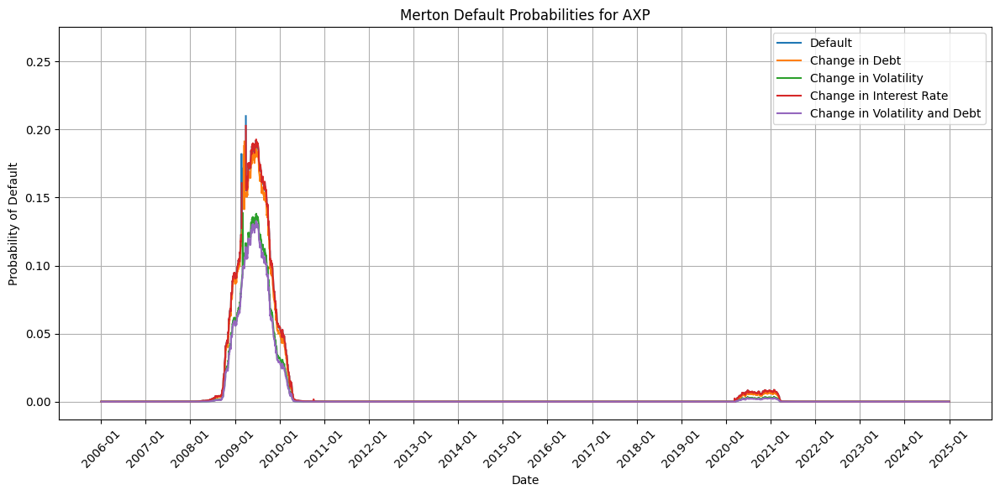

In [106]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Convert date columns to datetime (only do once)
for df_ in [df, df1, df2, df3, df4]:
    df_['date'] = pd.to_datetime(df_['date'])

# Ticker to plot
ticker = 'AXP'

# Filter for the ticker
df_ticker  = df[df['tic'] == ticker].sort_values('date')
df1_ticker = df1[df1['tic'] == ticker].sort_values('date')
df2_ticker = df2[df2['tic'] == ticker].sort_values('date')
df3_ticker = df3[df3['tic'] == ticker].sort_values('date')
df4_ticker = df4[df4['tic'] == ticker].sort_values('date')

# Plot
plt.figure(figsize=(12, 6))

plt.plot(df_ticker['date'], df_ticker['merton_pd'], label='Default')
plt.plot(df1_ticker['date'], df1_ticker['merton_pd'], label='Change in Debt')
plt.plot(df2_ticker['date'], df2_ticker['merton_pd'], label='Change in Volatility')
plt.plot(df3_ticker['date'], df3_ticker['merton_pd'], label='Change in Interest Rate')
plt.plot(df4_ticker['date'], df4_ticker['merton_pd'], label='Change in Volatility and Debt')

# Format x-axis for dates
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.xticks(rotation=45)

# Labels and title
plt.title(f'Merton Default Probabilities for {ticker}')
plt.xlabel('Date')
plt.ylabel('Probability of Default')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

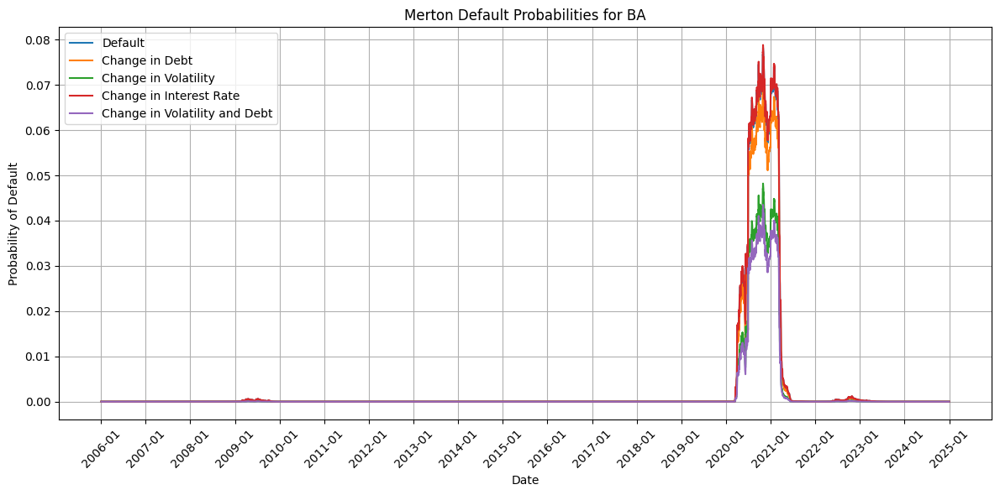

In [107]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Convert date columns to datetime (only do once)
for df_ in [df, df1, df2, df3, df4]:
    df_['date'] = pd.to_datetime(df_['date'])

# Ticker to plot
ticker = 'BA'

# Filter for the ticker
df_ticker  = df[df['tic'] == ticker].sort_values('date')
df1_ticker = df1[df1['tic'] == ticker].sort_values('date')
df2_ticker = df2[df2['tic'] == ticker].sort_values('date')
df3_ticker = df3[df3['tic'] == ticker].sort_values('date')
df4_ticker = df4[df4['tic'] == ticker].sort_values('date')

# Plot
plt.figure(figsize=(12, 6))

plt.plot(df_ticker['date'], df_ticker['merton_pd'], label='Default')
plt.plot(df1_ticker['date'], df1_ticker['merton_pd'], label='Change in Debt')
plt.plot(df2_ticker['date'], df2_ticker['merton_pd'], label='Change in Volatility')
plt.plot(df3_ticker['date'], df3_ticker['merton_pd'], label='Change in Interest Rate')
plt.plot(df4_ticker['date'], df4_ticker['merton_pd'], label='Change in Volatility and Debt')

# Format x-axis for dates
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.xticks(rotation=45)

# Labels and title
plt.title(f'Merton Default Probabilities for {ticker}')
plt.xlabel('Date')
plt.ylabel('Probability of Default')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

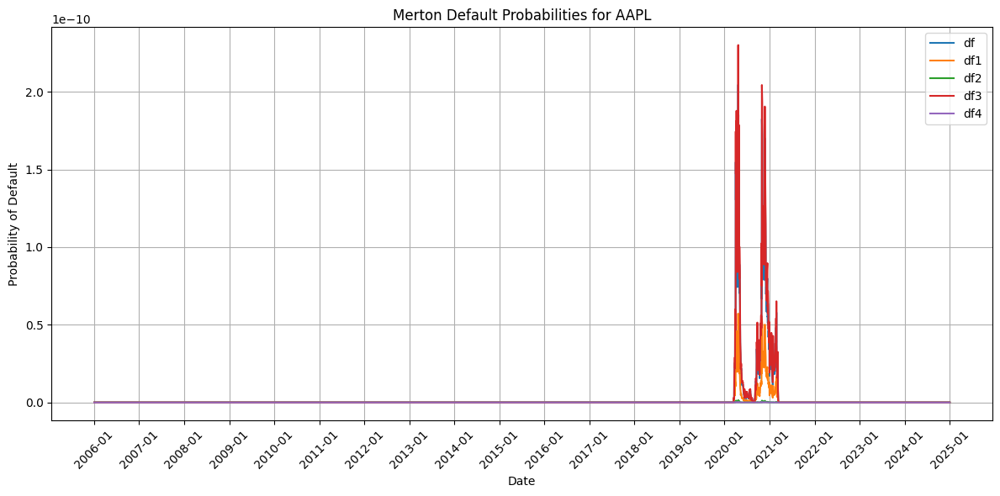

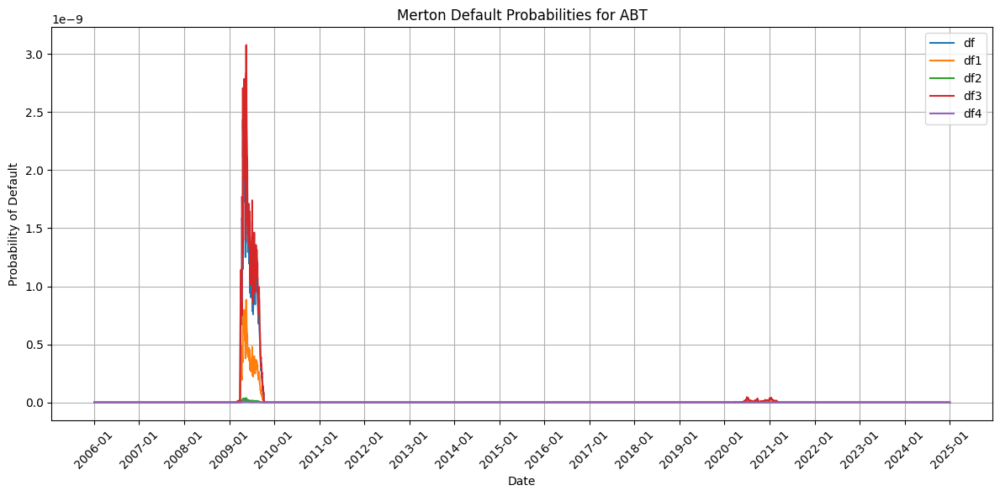

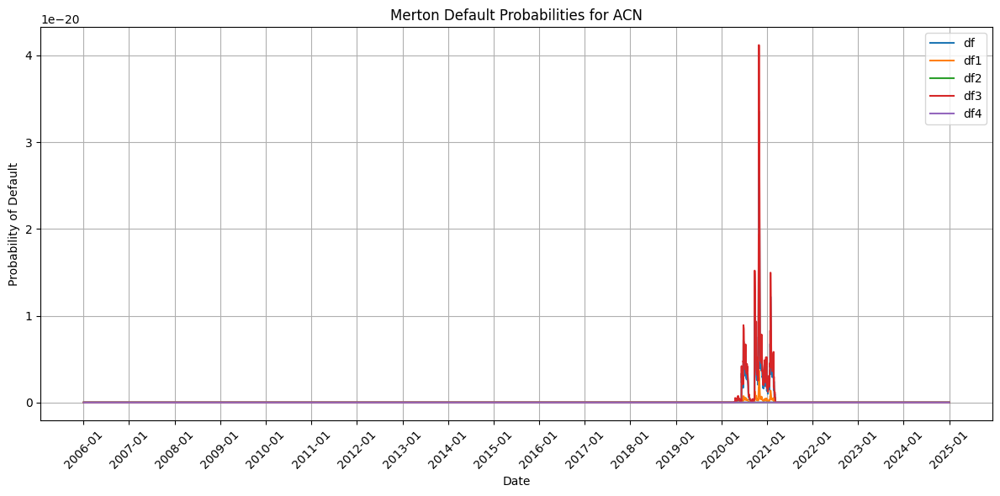

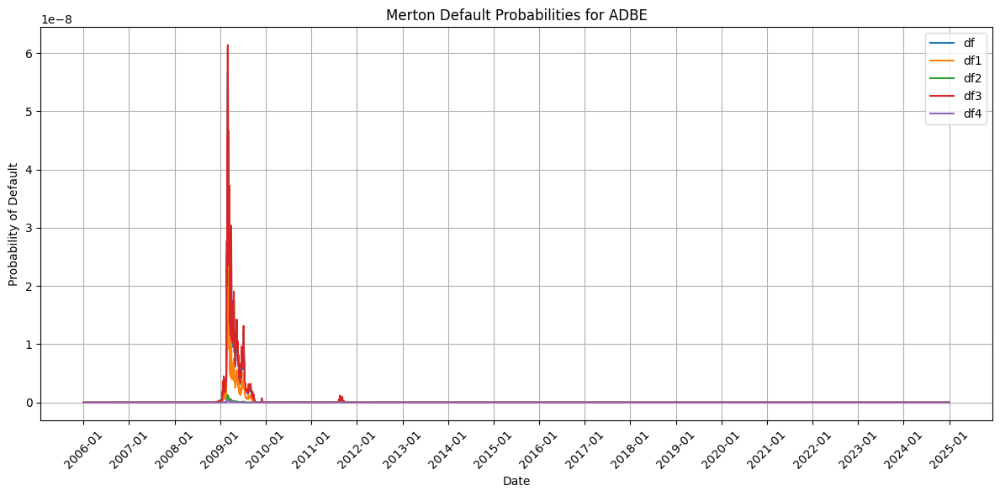

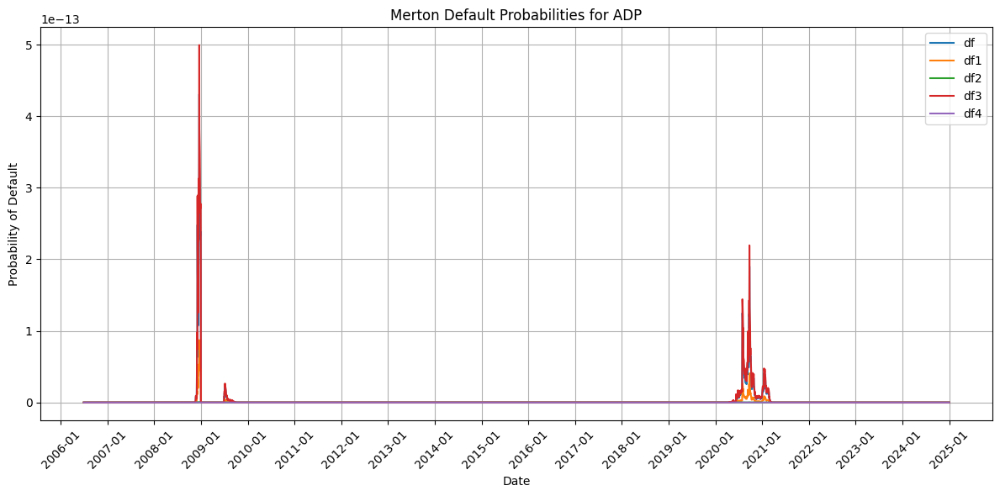

...

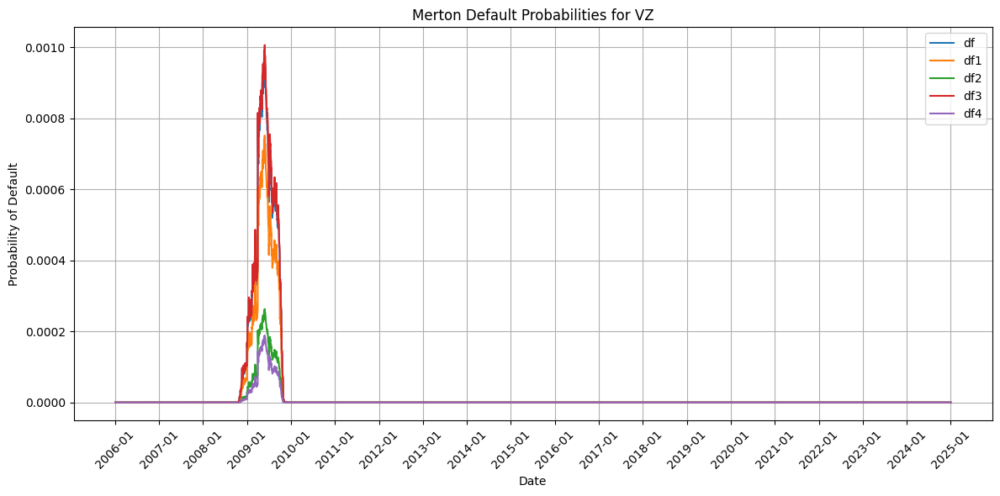

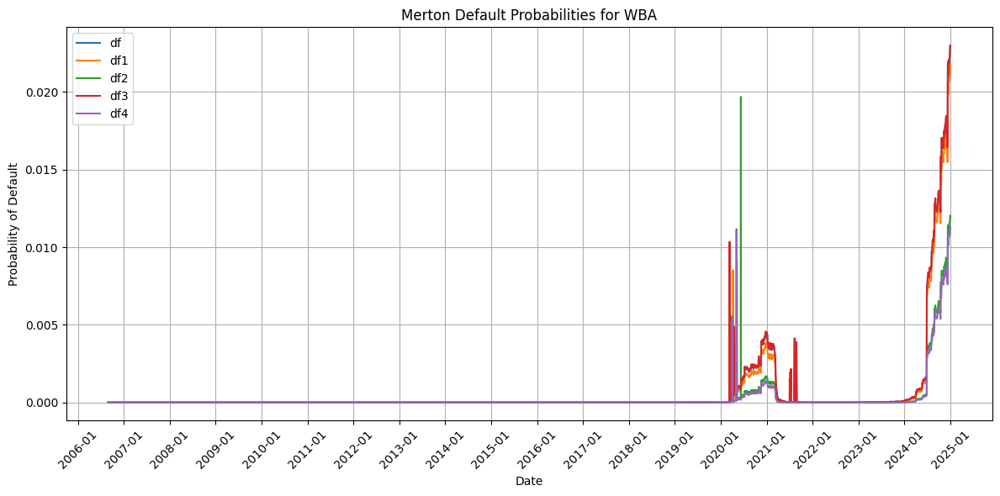

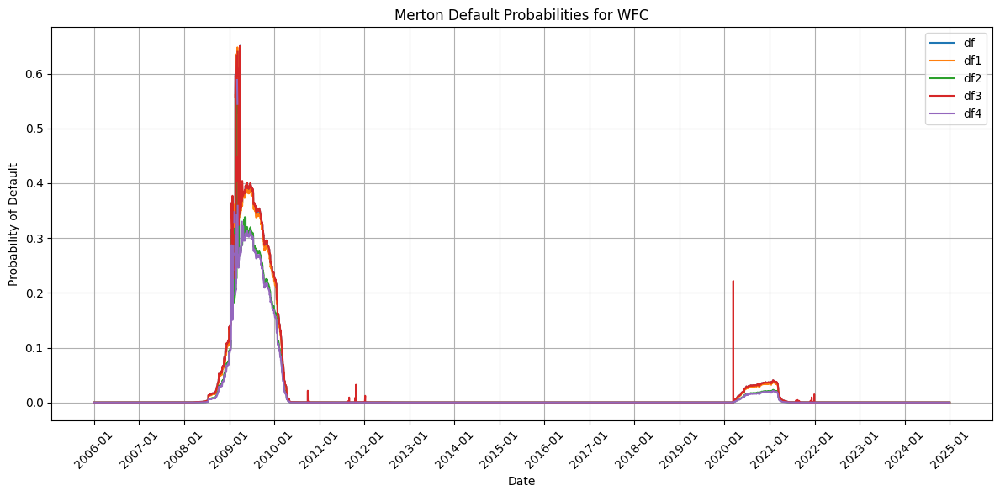

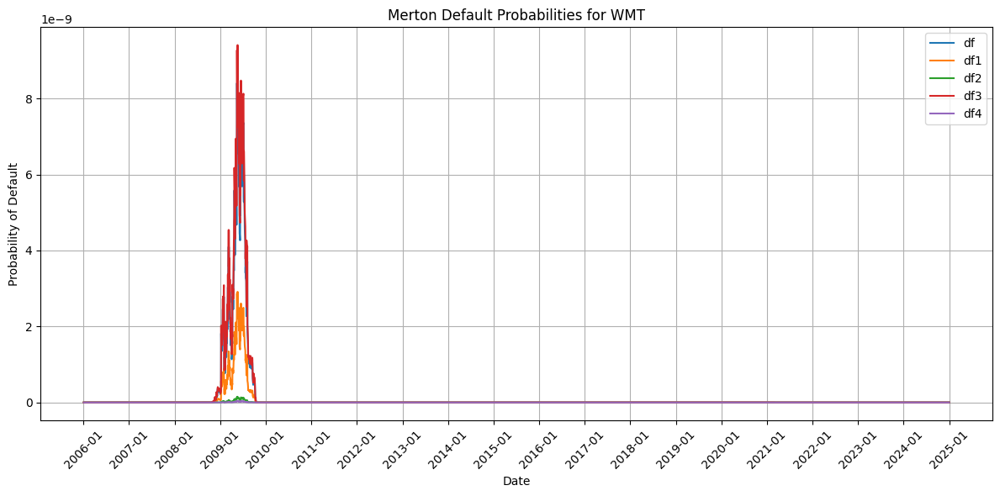

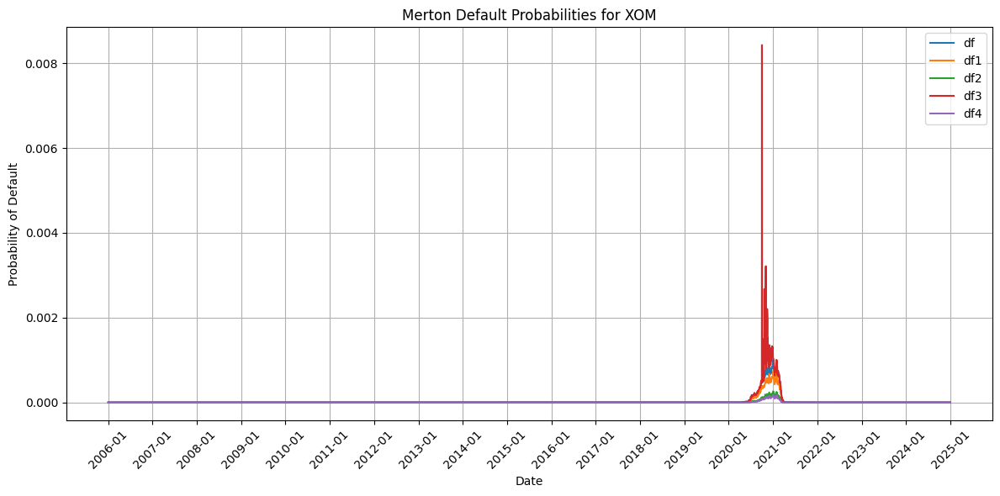

In [105]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Make sure all date columns are datetime
for df_ in [df, df1, df2, df3, df4]:
    df_['date'] = pd.to_datetime(df_['date'])

# Get list of all unique tickers (from the main df)
tickers = df['tic'].unique()

# Loop through each ticker
for ticker in tickers:
    # Filter and sort data for the ticker
    df_ticker  = df[df['tic'] == ticker].sort_values('date')
    df1_ticker = df1[df1['tic'] == ticker].sort_values('date')
    df2_ticker = df2[df2['tic'] == ticker].sort_values('date')
    df3_ticker = df3[df3['tic'] == ticker].sort_values('date')
    df4_ticker = df4[df4['tic'] == ticker].sort_values('date')
    
    # Skip if all dataframes are empty for the ticker
    if all(len(x) == 0 for x in [df_ticker, df1_ticker, df2_ticker, df3_ticker, df4_ticker]):
        continue

    # Start the plot
    plt.figure(figsize=(12, 6))
    
    # Plot each available DataFrame
    if not df_ticker.empty:
        plt.plot(df_ticker['date'], df_ticker['merton_pd'], label='df')
    if not df1_ticker.empty:
        plt.plot(df1_ticker['date'], df1_ticker['merton_pd'], label='df1')
    if not df2_ticker.empty:
        plt.plot(df2_ticker['date'], df2_ticker['merton_pd'], label='df2')
    if not df3_ticker.empty:
        plt.plot(df3_ticker['date'], df3_ticker['merton_pd'], label='df3')
    if not df4_ticker.empty:
        plt.plot(df4_ticker['date'], df4_ticker['merton_pd'], label='df4')
    
    # Format plot
    plt.title(f'Merton Default Probabilities for {ticker}')
    plt.xlabel('Date')
    plt.ylabel('Probability of Default')
    plt.legend()
    plt.grid(True)
    
    # Date formatting
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    plt.gca().xaxis.set_major_locator(mdates.YearLocator())
    plt.xticks(rotation=45)
    plt.tight_layout()
    
    # Show plot (or save if you prefer)
    plt.show()


#### Calculating Deltas